# Analyses of Baby Name Popularity Distribution in U.S. for the Last 144 Years

In [3]:
import numpy as np
import pandas as pd

# plotting
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import matplotlib.pyplot as plt

# stats
from statsmodels.api import tsa # time series analysis
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from datetime import datetime
import plotly



from warnings import filterwarnings
filterwarnings('ignore')

pd.options.display.max_columns = 100

import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()

## 1 Load Data

### 1.1 Last 144 Years Baby Name Dataset

In [4]:
file_path = '/Users/yingzhou/Downloads/Capstone_Babyname/Notebook_data/data.csv'

# Read the CSV file into a DataFrame
data = pd.read_csv(file_path, index_col=0)

# Display the first few rows to verify
print(data.head())

      Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio
0    Emily  2000      F  25959    6.867840          14.295257
1   Hannah  2000      F  23086    6.107745          12.713136
2  Madison  2000      F  19968    5.282832          10.996097
3   Ashley  2000      F  17998    4.761639           9.911246
4    Sarah  2000      F  17713    4.686238           9.754300


In [5]:
data.shape

(2117219, 6)

In [6]:
data['Name'].nunique

<bound method IndexOpsMixin.nunique of 0            Emily
1           Hannah
2          Madison
3           Ashley
4            Sarah
            ...   
2117214     Zyheem
2117215      Zykel
2117216     Zyking
2117217        Zyn
2117218      Zyran
Name: Name, Length: 2117219, dtype: object>

In [7]:
grouped = data.groupby(['Name', 'Year'])['Count'].sum().unstack()
grouped 

Year,1880,1881,1882,1883,1884,1885,1886,1887,1888,1889,1890,1891,1892,1893,1894,1895,1896,1897,1898,1899,1900,1901,1902,1903,1904,1905,1906,1907,1908,1909,1910,1911,1912,1913,1914,1915,1916,1917,1918,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,1929,...,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Aaban,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,6.0,9.0,11.0,11.0,14.0,16.0,15.0,9.0,11.0,7.0,6.0,NaN,NaN,7.0,NaN
Aabha,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,5.0,NaN,9.0,7.0,7.0,NaN,NaN,6.0,5.0,5.0,5.0,6.0
Aabid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,6.0,NaN,NaN,NaN,NaN,NaN
Aabidah,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN
Aabir,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,5.0,NaN,NaN,NaN,9.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zyvion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Zyvon,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Zyyanna,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [8]:
file_path = '/Users/yingzhou/Downloads/Capstone_Babyname/Notebook_data/dataset4.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(file_path, index_col=0)
df

,id,name,African,Arab,Caribbean,European,Greenlandic,indigenous peoples,Jewish,Middle Eastern,Romani,North African,Iranian-African,African-Jewish,Egyptian,Angolan,Beninese,Burkinabé,Burundian,Cameroonian,Cape Verdean,Central African Republic,Democratic Republic of the Congo,Republic of the Congo,Equatoguinean,Eritrean,Ethiopian,Gabonese,Gambian,Ghanaian,Bissau-Guinean,Guinean,Ivorian,Kenyan,Liberian,Malagasy,Malawian,Malian,Mauritanian,Mauritian,Moroccan,Mozambican,Nigerian,Nigerien,Rwandan,Senegalese,Sierra Leonean,Somali,South African,South Sudanese,...,Purépecha,Chamorro,Federated States of Micronesia,i-Kiribati,Marshallese,Palauan,Native Hawaiian,Māori,Niuean,Rotuman,Samoan,Tongan,Indian Tamil,Sri Lankan Tamil,South American-Jewish,English-Jewish,Scottish-Jewish,Welsh-Jewish,Middle Eastern-Jewish,Iranian-Azerbaijani,Laguna Pueblo,Black Nova Scotian,Indo-Guyanese,North African-Jewish,Hui,Chinese-Indonesian,Okinawan,North Korean,South Korean,Mongol,Mongolian,Atayal,Indo-Fijian,Gujarati,Kannada,Kashmiri,Malayali,Marathi,Sindhi,Baloch,Azad Kashmiri,Ilocano,Kapampangan,Javanese,Minangkabau,Azerbaijani-Jewish,Acadian,Québécois,Pennsylvania Dutch,I-Taukei Fijian
0,595,Andre Agassi,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,864,Andy Warhol,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1384,Amos Bronson Alcott,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1624,Andrew Johnson,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1806,Arnold Schwarzenegger,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25535,74560165,Tom Burckhardt,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
25536,74565128,Sana Javeri Kadri,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
25537,74566983,Bashar Wali,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
25538,74584291,Ernest Lagarde,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [9]:
df['name'] = df['name'].str.split().str[0]

# Display the updated DataFrame
print(df[['id', 'name']].head())

     id    name
0   595   Andre
1   864    Andy
2  1384    Amos
3  1624  Andrew
4  1806  Arnold


In [10]:
df.shape

(25540, 493)

In [11]:
famous_people=df['name']

famous_people

0         Andre
1          Andy
2          Amos
3        Andrew
4        Arnold
          ...  
25535       Tom
25536      Sana
25537    Bashar
25538    Ernest
25539      King
Name: name, Length: 25540, dtype: object

## 2 Baby Name Key Insights

### 2.1 Baby Name Trendency over 143 Years

#### Top 1000 names vs. Name Occurances More than 10 times

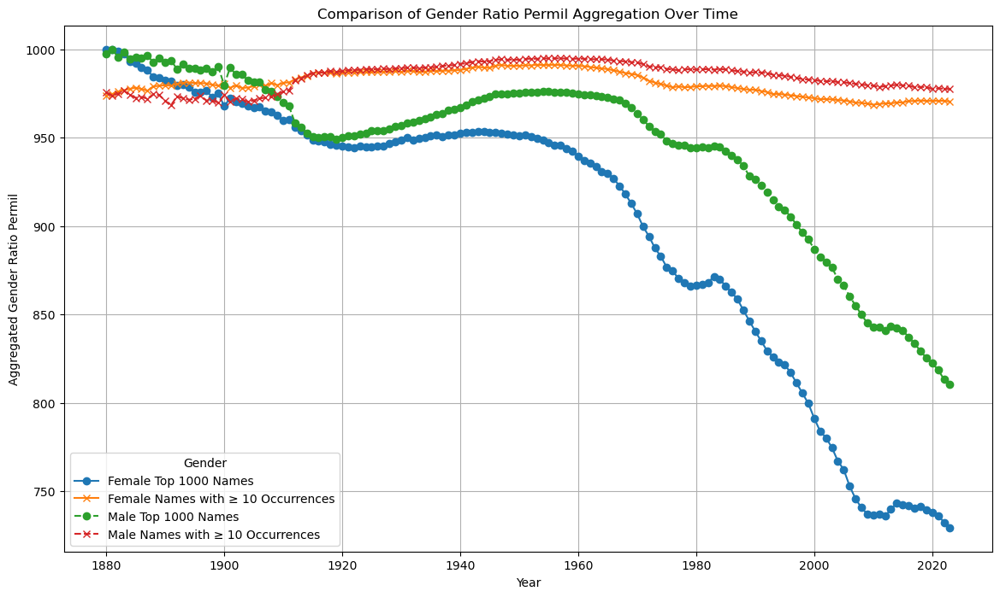

In [12]:
# Generalized function to aggregate name gender ratio over years
def aggregate_gender_data(data, gender, top_n=None, min_count=None):
    # Filter data for the specified gender
    gender_data = data[data['Gender'] == gender]
    
    # If filtering by minimum count (e.g., Count >= 10)
    if min_count is not None:
        gender_data = gender_data[gender_data['Count'] >= min_count]
    
    # Initialize an empty DataFrame to collect results
    aggregated_data = pd.DataFrame()
    
    # Iterate over each year
    for year in gender_data['Year'].unique():
        year_data = gender_data[gender_data['Year'] == year]
        
        # If top_n is provided, filter for the top N names by Count
        if top_n is not None:
            year_data = year_data.nlargest(top_n, 'Count')
        
        # Aggregate metrics for the selected names
        aggregated = year_data.groupby('Year').agg({
            'Gender_Name_Ratio': 'sum',
            'Name_Ratio': 'sum'
        }).reset_index()

        aggregated_data = pd.concat([aggregated_data, aggregated], ignore_index=True)
    
    # Sort the data by Year
    aggregated_data = aggregated_data.sort_values(by='Year').reset_index(drop=True)
    
    return aggregated_data

# Get aggregated data for female and male
top_female_1000 = aggregate_gender_data(data, 'F', top_n=1000)
top_male_1000 = aggregate_gender_data(data, 'M', top_n=1000)

filtered_female_10_or_more = aggregate_gender_data(data, 'F', min_count=10)
filtered_male_10_or_more = aggregate_gender_data(data, 'M', min_count=10)

# Plotting the results for Gender Name Ratio
plt.figure(figsize=(14, 8))

plt.plot(top_female_1000['Year'], top_female_1000['Gender_Name_Ratio'], marker='o', label='Female Top 1000 Names')
plt.plot(filtered_female_10_or_more['Year'], filtered_female_10_or_more['Gender_Name_Ratio'], marker='x', label='Female Names with ≥ 10 Occurrences')

plt.plot(top_male_1000['Year'], top_male_1000['Gender_Name_Ratio'], marker='o', linestyle='--', label='Male Top 1000 Names')
plt.plot(filtered_male_10_or_more['Year'], filtered_male_10_or_more['Gender_Name_Ratio'], marker='x', linestyle='--', label='Male Names with ≥ 10 Occurrences')

plt.title('Comparison of Gender Ratio Permil Aggregation Over Time')
plt.xlabel('Year')
plt.ylabel('Aggregated Gender Ratio Permil')
plt.legend(title='Gender')
plt.grid(True)


#### Top 1000 names vs. Popular Name Occurances More than 1000 times

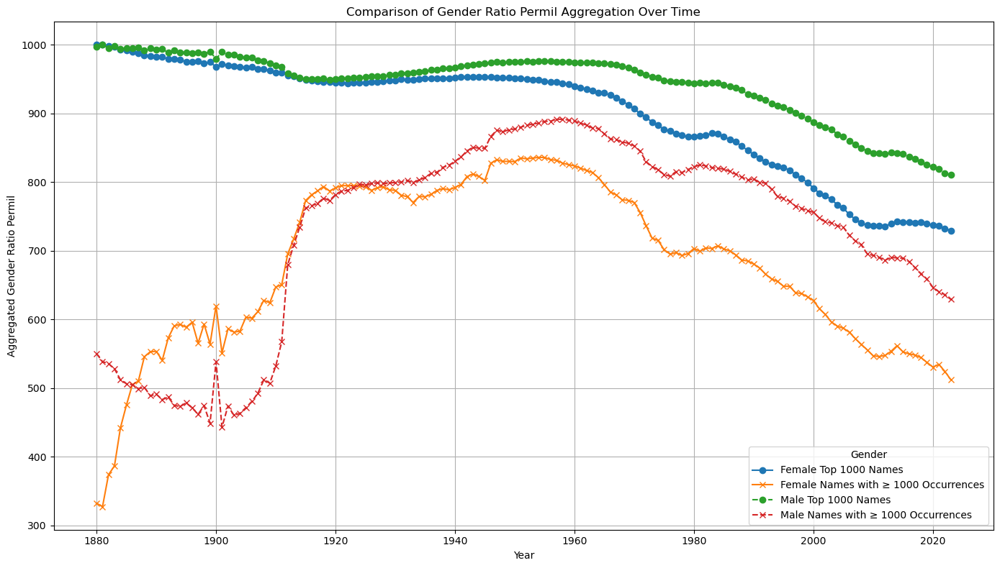

In [13]:
# Function to aggregate name gender ratio over years for top 1000 names
def aggregate_top_1000(data, gender):
    # Filter data for the specified gender
    gender_data = data[data['Gender'] == gender]
    
    # Initialize an empty DataFrame to collect results
    aggregated_data = pd.DataFrame()
    
    # Iterate over each year
    for year in gender_data['Year'].unique():
        year_data = gender_data[gender_data['Year'] == year]
        top_1000_names = year_data.nlargest(1000, 'Count')
        
        # Aggregate metrics for top 1000 names
        aggregated = top_1000_names.groupby('Year').agg({
            'Gender_Name_Ratio': 'sum',
            'Name_Ratio': 'sum'
        }).reset_index()

        aggregated_data = pd.concat([aggregated_data, aggregated], ignore_index=True)
    
    # Sort the data by Year
    aggregated_data = aggregated_data.sort_values(by='Year').reset_index(drop=True)
    
    return aggregated_data

# Function to aggregate name gender ratio over years excluding names with fewer than 10 occurrences
def aggregated_exclude_less_than_1000(data, gender):
    # Filter data for the specified gender
    gender_data = data[data['Gender'] == gender]
    
    # Exclude names with fewer than 10 occurrences
    gender_data = gender_data[gender_data['Count'] >= 1000]
    
    # Initialize an empty DataFrame to collect results
    aggregated_data = pd.DataFrame()
    
    # Iterate over each year
    for year in gender_data['Year'].unique():
        year_data = gender_data[gender_data['Year'] == year]
        top_1000_names = year_data.nlargest(1000, 'Count')
        
        # Aggregate metrics for top 1000 names
        aggregated = top_1000_names.groupby('Year').agg({
            'Gender_Name_Ratio': 'sum',
            'Name_Ratio': 'sum'
        }).reset_index()

        aggregated_data = pd.concat([aggregated_data, aggregated], ignore_index=True)
    
    # Sort the data by Year
    aggregated_data = aggregated_data.sort_values(by='Year').reset_index(drop=True)
    
    return aggregated_data

# Get aggregated data for female and male
top_female_1000 = aggregate_top_1000(data, 'F')
top_male_1000 = aggregate_top_1000(data, 'M')

filtered_female_1000_or_more = aggregated_exclude_less_than_1000(data, 'F')
filtered_male_1000_or_more = aggregated_exclude_less_than_1000(data, 'M')

# Plotting the results for Gender Name Ratio
plt.figure(figsize=(14, 8))

plt.plot(top_female_1000['Year'], top_female_1000['Gender_Name_Ratio'], marker='o', label='Female Top 1000 Names')
plt.plot(filtered_female_1000_or_more['Year'], filtered_female_1000_or_more['Gender_Name_Ratio'], marker='x', label='Female Names with ≥ 1000 Occurrences')

plt.plot(top_male_1000['Year'], top_male_1000['Gender_Name_Ratio'], marker='o', linestyle='--', label='Male Top 1000 Names')
plt.plot(filtered_male_1000_or_more['Year'], filtered_male_1000_or_more['Gender_Name_Ratio'], marker='x', linestyle='--', label='Male Names with ≥ 1000 Occurrences')

plt.title('Comparison of Gender Ratio Permil Aggregation Over Time')
plt.xlabel('Year')
plt.ylabel('Aggregated Gender Ratio Permil')
plt.legend(title='Gender')
plt.grid(True)
plt.tight_layout()
plt.show()

In [14]:
def get_top_1000_each_year(data):
    # Group data by 'Year' and apply nlargest to get top 1000 names for each year
    top_1000_per_year = data.groupby('Year').apply(lambda x: x.nlargest(1000, 'Count')).reset_index(drop=True)
    return top_1000_per_year

# Update your dataframe to include only the top 1000 names for each year
top_1000_data = get_top_1000_each_year(data)

# Display the updated dataframe
print(top_1000_data)

           Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio
0          John  1880      M   9655   47.919438          87.383474
1       William  1880      M   9532   47.308967          86.270251
2          Mary  1880      F   7065   35.064819          77.642482
3         James  1880      M   5927   29.416728          53.642864
4       Charles  1880      M   5348   26.543051          48.402570
...         ...   ...    ...    ...         ...                ...
143995  Rodrigo  2023      M    606    0.183790           0.356214
143996    Uriel  2023      M    606    0.183790           0.356214
143997   Marlee  2023      F    605    0.183486           0.379067
143998    Lucca  2023      M    605    0.183486           0.355626
143999   Philip  2023      M    605    0.183486           0.355626

[144000 rows x 6 columns]


In [15]:
top_1000_data.to_csv('top_1000_data.csv')

## 3 Baby Name Feature Engineering

### Famous People Binary

In [16]:
# Extract the first names from the famous_people DataFrame (if not already done)
famous_people_set = set(famous_people)  # Convert famous people names to a set for faster lookup

# Add a binary column 'Is_Famous' to top_1000_data based on whether the name is in famous_people
top_1000_data['Is_Famous'] = top_1000_data['Name'].apply(lambda x: 1 if x in famous_people_set else 0)

# Display the updated dataframe
print(top_1000_data.head())


      Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio  Is_Famous
0     John  1880      M   9655   47.919438          87.383474          1
1  William  1880      M   9532   47.308967          86.270251          1
2     Mary  1880      F   7065   35.064819          77.642482          1
3    James  1880      M   5927   29.416728          53.642864          1
4  Charles  1880      M   5348   26.543051          48.402570          1


In [17]:
# Convert the 'Gender' column into binary: 1 for 'M' and 0 for 'F'
top_1000_data['Gender_Binary'] = top_1000_data['Gender'].map({'M': 1, 'F': 0})

# Display the updated dataframe
print(top_1000_data.head())

      Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio  Is_Famous  \
0     John  1880      M   9655   47.919438          87.383474          1   
1  William  1880      M   9532   47.308967          86.270251          1   
2     Mary  1880      F   7065   35.064819          77.642482          1   
3    James  1880      M   5927   29.416728          53.642864          1   
4  Charles  1880      M   5348   26.543051          48.402570          1   

   Gender_Binary  
0              1  
1              1  
2              0  
3              1  
4              1  


### Year of Last Appearance

In [18]:
# Calculate the Year of Last Appearance
# Group by 'Name' and find the max 'Year' for each name
last_appearance = top_1000_data.groupby('Name')['Year'].max().reset_index()

# Rename the column to 'Year_of_Last_Appearance'
last_appearance = last_appearance.rename(columns={'Year': 'Year_of_Last_Appearance'})

# Merge this information back into the original dataframe
data1 = top_1000_data.merge(last_appearance, on='Name', how='left')

# Display the updated dataframe
print(data1.head())

      Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio  Is_Famous  \
0     John  1880      M   9655   47.919438          87.383474          1   
1  William  1880      M   9532   47.308967          86.270251          1   
2     Mary  1880      F   7065   35.064819          77.642482          1   
3    James  1880      M   5927   29.416728          53.642864          1   
4  Charles  1880      M   5348   26.543051          48.402570          1   

   Gender_Binary  Year_of_Last_Appearance  
0              1                     2023  
1              1                     2023  
2              0                     2023  
3              1                     2023  
4              1                     2023  


### Top 100 Names

In [19]:
# Function to get top 100 names for each year
def get_top_100_per_year(data):
    top_100_per_year = data.groupby('Year').apply(lambda x: x.nlargest(100, 'Count')).reset_index(drop=True)
    return top_100_per_year

# Get top 100 names for each year
top_100_per_year = get_top_100_per_year(data1)

In [20]:
# Merge the top 100 names back to the original DataFrame
data1 = data1.merge(top_100_per_year[['Year', 'Name']], on=['Year', 'Name'], how='left', indicator=True)

# Create the binary column 'Is_Top_100'
data1['Is_Top_100'] = (data1['_merge'] == 'both').astype(int)

# Drop the '_merge' column
data1 = data1.drop(columns=['_merge'])

# Display the updated DataFrame
print(data1)


           Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio  Is_Famous  \
0          John  1880      M   9655   47.919438          87.383474          1   
1       William  1880      M   9532   47.308967          86.270251          1   
2          Mary  1880      F   7065   35.064819          77.642482          1   
3         James  1880      M   5927   29.416728          53.642864          1   
4       Charles  1880      M   5348   26.543051          48.402570          1   
...         ...   ...    ...    ...         ...                ...        ...   
144037  Rodrigo  2023      M    606    0.183790           0.356214          1   
144038    Uriel  2023      M    606    0.183790           0.356214          0   
144039   Marlee  2023      F    605    0.183486           0.379067          0   
144040    Lucca  2023      M    605    0.183486           0.355626          0   
144041   Philip  2023      M    605    0.183486           0.355626          1   

        Gender_Binary  Year

### Rolling Averages

In [21]:
# Calculate a 5-year rolling average for the 'Count' column
data1['Rolling_Average_Count_5_Years'] = data1.groupby('Name')['Count'].rolling(window=5, min_periods=1).mean().reset_index(level=0, drop=True)

# Calculate a 5-year rolling average for the 'Gender_Ratio' column
data1['Rolling_Average_Gender_Ratio_5_Years'] = data1.groupby('Name')['Gender_Name_Ratio'].rolling(window=5, min_periods=1).mean().reset_index(level=0, drop=True)

# Calculate a 5-year rolling average for the National Ratio
data1['Rolling_Average_National_Ratio_5_Years'] = data1.groupby('Name')['Name_Ratio'].rolling(window=5, min_periods=1).mean().reset_index(level=0, drop=True)

data2 = data1.sort_values(by=['Name', 'Year'])

# Display the updated dataframe with both rolling averages
print(data2.head(10))

           Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio  Is_Famous  \
128731    Aaden  2008      M    958    0.243760           0.469689          0   
129570    Aaden  2009      M   1268    0.331981           0.639458          0   
114438  Aaliyah  1994      F   1451    0.390318           0.812591          0   
115498  Aaliyah  1995      F   1256    0.342980           0.714250          0   
116688  Aaliyah  1996      F    831    0.227856           0.474070          0   
117404  Aaliyah  1997      F   1739    0.479641           0.999072          0   
118490  Aaliyah  1998      F   1399    0.380361           0.791813          0   
119601  Aaliyah  1999      F   1088    0.294552           0.613397          0   
120478  Aaliyah  2000      F   1496    0.395789           0.823826          0   
121251  Aaliyah  2001      F   3352    0.895475           1.861712          0   

        Gender_Binary  Year_of_Last_Appearance  Is_Top_100  \
128731              1                     2009

### Yearly changes

In [22]:
# The NAN data is filled with 0

In [23]:
# Sorted by 'Name' and 'Year' 
data1 = data1.sort_values(by=['Name', 'Year'])

# Calculate yearly change for 'Count'
data1['Yearly_Change_Count'] = data1.groupby('Name')['Count'].diff().fillna(0)

# Calculate yearly change for 'Gender_Name_Ratio'
data1['Yearly_Change_Gender_Ratio'] = data1.groupby('Name')['Gender_Name_Ratio'].diff().fillna(0)

# Calculate yearly change for 'Name_Ratio'
data1['Yearly_Change_National_Ratio'] = data1.groupby('Name')['Name_Ratio'].diff().fillna(0)

# Sort the DataFrame again (optional, if needed)
data2 = data1.sort_values(by=['Name', 'Year'])

# Display the updated DataFrame with yearly changes
print(data2.head(10))

           Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio  Is_Famous  \
128731    Aaden  2008      M    958    0.243760           0.469689          0   
129570    Aaden  2009      M   1268    0.331981           0.639458          0   
114438  Aaliyah  1994      F   1451    0.390318           0.812591          0   
115498  Aaliyah  1995      F   1256    0.342980           0.714250          0   
116688  Aaliyah  1996      F    831    0.227856           0.474070          0   
117404  Aaliyah  1997      F   1739    0.479641           0.999072          0   
118490  Aaliyah  1998      F   1399    0.380361           0.791813          0   
119601  Aaliyah  1999      F   1088    0.294552           0.613397          0   
120478  Aaliyah  2000      F   1496    0.395789           0.823826          0   
121251  Aaliyah  2001      F   3352    0.895475           1.861712          0   

        Gender_Binary  Year_of_Last_Appearance  Is_Top_100  \
128731              1                     2009

### Name length

In [24]:
# Calculate the length of each name
data2['Name_Length'] = data2['Name'].apply(len)
print(data2.head(10))

           Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio  Is_Famous  \
128731    Aaden  2008      M    958    0.243760           0.469689          0   
129570    Aaden  2009      M   1268    0.331981           0.639458          0   
114438  Aaliyah  1994      F   1451    0.390318           0.812591          0   
115498  Aaliyah  1995      F   1256    0.342980           0.714250          0   
116688  Aaliyah  1996      F    831    0.227856           0.474070          0   
117404  Aaliyah  1997      F   1739    0.479641           0.999072          0   
118490  Aaliyah  1998      F   1399    0.380361           0.791813          0   
119601  Aaliyah  1999      F   1088    0.294552           0.613397          0   
120478  Aaliyah  2000      F   1496    0.395789           0.823826          0   
121251  Aaliyah  2001      F   3352    0.895475           1.861712          0   

        Gender_Binary  Year_of_Last_Appearance  Is_Top_100  \
128731              1                     2009

### Name vowels

In [25]:
# Define a function to count vowels and consonants
def count_vowels(name):
    vowels = 'AEIOUaeiou'
    return sum(1 for char in name if char in vowels)

def count_consonants(name):
    vowels = 'AEIOUaeiou'
    return sum(1 for char in name if char.isalpha() and char not in vowels)

# Calculate vowel and consonant counts
data2['Vowel_Count'] = data2['Name'].apply(count_vowels)
data2['Consonant_Count'] = data2['Name'].apply(count_consonants)
data2['Vowel_Ratio'] = (data2['Vowel_Count']/data2['Name_Length'])

# Display the updated dataframe
print(data2.head(10))

           Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio  Is_Famous  \
128731    Aaden  2008      M    958    0.243760           0.469689          0   
129570    Aaden  2009      M   1268    0.331981           0.639458          0   
114438  Aaliyah  1994      F   1451    0.390318           0.812591          0   
115498  Aaliyah  1995      F   1256    0.342980           0.714250          0   
116688  Aaliyah  1996      F    831    0.227856           0.474070          0   
117404  Aaliyah  1997      F   1739    0.479641           0.999072          0   
118490  Aaliyah  1998      F   1399    0.380361           0.791813          0   
119601  Aaliyah  1999      F   1088    0.294552           0.613397          0   
120478  Aaliyah  2000      F   1496    0.395789           0.823826          0   
121251  Aaliyah  2001      F   3352    0.895475           1.861712          0   

        Gender_Binary  Year_of_Last_Appearance  Is_Top_100  \
128731              1                     2009

### Name Endings with A, E, I

Many female names tend to end with the letters "a," "e," or "i." This characteristic could be an interesting feature to analyze when studying name patterns and trends. Exploring how frequently female names end with these letters may provide valuable insights into naming conventions and preferences over time.

https://pubmed.ncbi.nlm.nih.gov/11026389/#:~:text=Most%20female%20names%20end%20with,similar%20frequency%20for%20both%20sexes.

In [26]:
# Function to check if a name ends with one of the specified letters
def ends_with(name, letters):
    return any(name.endswith(letter) for letter in letters)

# List of letters to check
end_letters = ['a', 'e', 'i']

# Create a new column 'Ends_With_Specified_Letters'
data2['Ends_With_Specified_Letters'] = \
          data2['Name'].apply(lambda x: int(ends_with(x, end_letters)))
print(data2)

           Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio  Is_Famous  \
128731    Aaden  2008      M    958    0.243760           0.469689          0   
129570    Aaden  2009      M   1268    0.331981           0.639458          0   
114438  Aaliyah  1994      F   1451    0.390318           0.812591          0   
115498  Aaliyah  1995      F   1256    0.342980           0.714250          0   
116688  Aaliyah  1996      F    831    0.227856           0.474070          0   
...         ...   ...    ...    ...         ...                ...        ...   
143482     Zuri  2023      F   1471    0.446130           0.921666          0   
140946   Zyaire  2020      M    671    0.201028           0.389290          0   
141802   Zyaire  2021      M    833    0.246108           0.476954          0   
142778   Zyaire  2022      M    869    0.257206           0.498865          0   
143664   Zyaire  2023      M   1029    0.312079           0.604859          0   

        Gender_Binary  Year

In [27]:
# Check for null values
null_values = data2.isna().sum()

null_values

Name                                      0
Year                                      0
Gender                                    0
Count                                     0
Name_Ratio                                0
Gender_Name_Ratio                         0
Is_Famous                                 0
Gender_Binary                             0
Year_of_Last_Appearance                   0
Is_Top_100                                0
Rolling_Average_Count_5_Years             0
Rolling_Average_Gender_Ratio_5_Years      0
Rolling_Average_National_Ratio_5_Years    0
Yearly_Change_Count                       0
Yearly_Change_Gender_Ratio                0
Yearly_Change_National_Ratio              0
Name_Length                               0
Vowel_Count                               0
Consonant_Count                           0
Vowel_Ratio                               0
Ends_With_Specified_Letters               0
dtype: int64

In [28]:
data2.to_csv('Featured_Data.csv')

In [31]:
df_num= data2.select_dtypes('number')

In [32]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 144042 entries, 128731 to 143664
Data columns (total 19 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   Year                                    144042 non-null  int64  
 1   Count                                   144042 non-null  int64  
 2   Name_Ratio                              144042 non-null  float64
 3   Gender_Name_Ratio                       144042 non-null  float64
 4   Is_Famous                               144042 non-null  int64  
 5   Gender_Binary                           144042 non-null  int64  
 6   Year_of_Last_Appearance                 144042 non-null  int64  
 7   Is_Top_100                              144042 non-null  int64  
 8   Rolling_Average_Count_5_Years           144042 non-null  float64
 9   Rolling_Average_Gender_Ratio_5_Years    144042 non-null  float64
 10  Rolling_Average_National_Ratio_5_Years 

In [33]:
df_num.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,144042.0,1951.492523,41.569789,1880.000000,1915.000000,1951.000000,1987.000000,2023.000000
Count,144042.0,2161.133385,5255.961871,12.000000,289.000000,707.000000,1803.000000,99693.000000
Name_Ratio,144042.0,0.870970,2.030888,0.062277,0.147566,0.279933,0.723654,47.919438
Gender_Name_Ratio,144042.0,1.739263,4.107321,0.103175,0.297615,0.564183,1.450780,87.383474
Is_Famous,144042.0,0.802002,0.398492,0.000000,1.000000,1.000000,1.000000,1.000000
Gender_Binary,144042.0,0.448175,0.497309,0.000000,0.000000,0.000000,1.000000,1.000000
Year_of_Last_Appearance,144042.0,1996.102297,32.006015,1880.000000,1977.000000,2008.000000,2023.000000,2023.000000
Is_Top_100,144042.0,0.108454,0.310955,0.000000,0.000000,0.000000,0.000000,1.000000
Rolling_Average_Count_5_Years,144042.0,2134.279382,4911.032210,12.000000,279.000000,713.000000,1834.400000,90200.400000
Rolling_Average_Gender_Ratio_5_Years,144042.0,1.747132,3.653994,0.103332,0.304378,0.582675,1.496027,87.383474


In [34]:
df_num.describe()[5:6].T

,50%
Year,1951.000000
Count,707.000000
Name_Ratio,0.279933
Gender_Name_Ratio,0.564183
Is_Famous,1.000000
Gender_Binary,0.000000
Year_of_Last_Appearance,2008.000000
Is_Top_100,0.000000
Rolling_Average_Count_5_Years,713.000000
Rolling_Average_Gender_Ratio_5_Years,0.582675


## 4 EDA

In [35]:
df_num.corr()

,Year,Count,Name_Ratio,Gender_Name_Ratio,Is_Famous,Gender_Binary,Year_of_Last_Appearance,Is_Top_100,Rolling_Average_Count_5_Years,Rolling_Average_Gender_Ratio_5_Years,Rolling_Average_National_Ratio_5_Years,Yearly_Change_Count,Yearly_Change_Gender_Ratio,Yearly_Change_National_Ratio,Name_Length,Vowel_Count,Consonant_Count,Vowel_Ratio,Ends_With_Specified_Letters
Year,1.000000,0.161373,-0.036903,-0.036519,0.022244,0.038012,0.499322,-0.004903,0.181041,-0.040141,-0.040081,-0.005529,0.000359,0.000310,0.064136,-0.000330,0.083084,-0.059804,-0.108637
Count,0.161373,1.000000,0.808958,0.794971,0.139246,0.061471,0.214088,0.598258,0.946414,0.775052,0.782616,0.340546,0.254031,0.263370,0.020737,-0.051397,0.066790,-0.083985,-0.108585
Name_Ratio,-0.036903,0.808958,1.000000,0.984114,0.140974,0.031794,0.178174,0.654743,0.733497,0.905704,0.917826,0.366629,0.443106,0.451003,-0.003307,-0.055173,0.038677,-0.068576,-0.083264
Gender_Name_Ratio,-0.036519,0.794971,0.984114,1.000000,0.142513,0.054047,0.181397,0.641330,0.719548,0.912779,0.897949,0.364012,0.465685,0.456527,-0.002146,-0.059950,0.043895,-0.076258,-0.093354
Is_Famous,0.022244,0.139246,0.140974,0.142513,1.000000,0.179363,0.348909,0.155370,0.148571,0.161862,0.158753,0.000216,-0.000931,-0.001016,-0.083339,-0.096889,-0.032206,-0.055962,-0.148945
Gender_Binary,0.038012,0.061471,0.031794,0.054047,0.179363,1.000000,0.150653,0.012733,0.052629,0.038943,0.018641,0.037629,0.044520,0.035611,-0.083679,-0.300835,0.126112,-0.308932,-0.551761
Year_of_Last_Appearance,0.499322,0.214088,0.178174,0.181397,0.348909,0.150653,1.000000,0.180284,0.225507,0.202326,0.196965,0.002436,0.000595,0.000550,0.062087,0.007387,0.074431,-0.045138,-0.192343
Is_Top_100,-0.004903,0.598258,0.654743,0.641330,0.155370,0.012733,0.180284,1.000000,0.628658,0.722628,0.730472,0.005373,-0.002792,-0.002752,-0.005338,-0.054518,0.035544,-0.061081,-0.080932
Rolling_Average_Count_5_Years,0.181041,0.946414,0.733497,0.719548,0.148571,0.052629,0.225507,0.628658,1.000000,0.801839,0.810032,0.051298,0.038709,0.040067,0.022229,-0.055755,0.072109,-0.091001,-0.115160
Rolling_Average_Gender_Ratio_5_Years,-0.040141,0.775052,0.905704,0.912779,0.161862,0.038943,0.202326,0.722628,0.801839,1.000000,0.985480,0.071169,0.084131,0.081868,-0.003585,-0.069003,0.049084,-0.086867,-0.104354


In [36]:
df_num.corr()[7:8].T

,Is_Top_100
Year,-0.004903
Count,0.598258
Name_Ratio,0.654743
Gender_Name_Ratio,0.641330
Is_Famous,0.155370
Gender_Binary,0.012733
Year_of_Last_Appearance,0.180284
Is_Top_100,1.000000
Rolling_Average_Count_5_Years,0.628658
Rolling_Average_Gender_Ratio_5_Years,0.722628


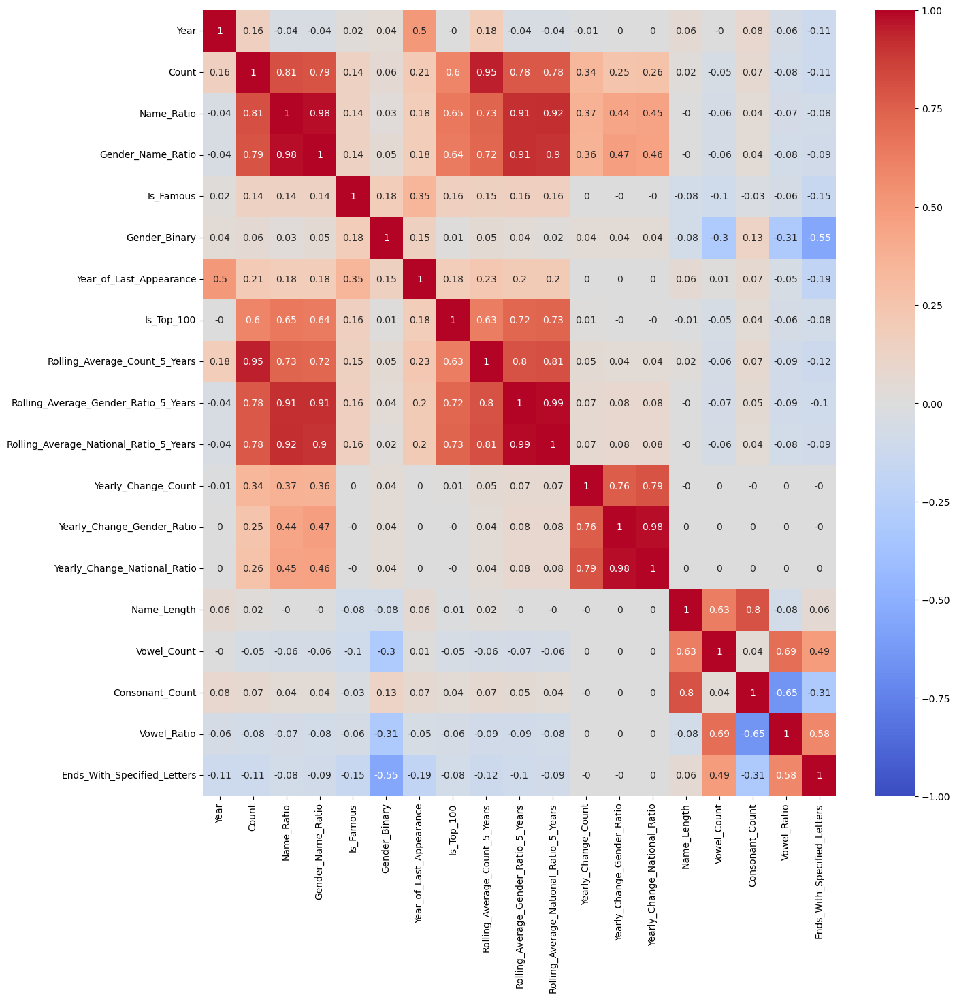

In [37]:
plt.figure(figsize=(15,15))
sns.heatmap(df_num.corr().round(2), vmin=-1,vmax=1, cmap='coolwarm',annot=True)
plt.show()

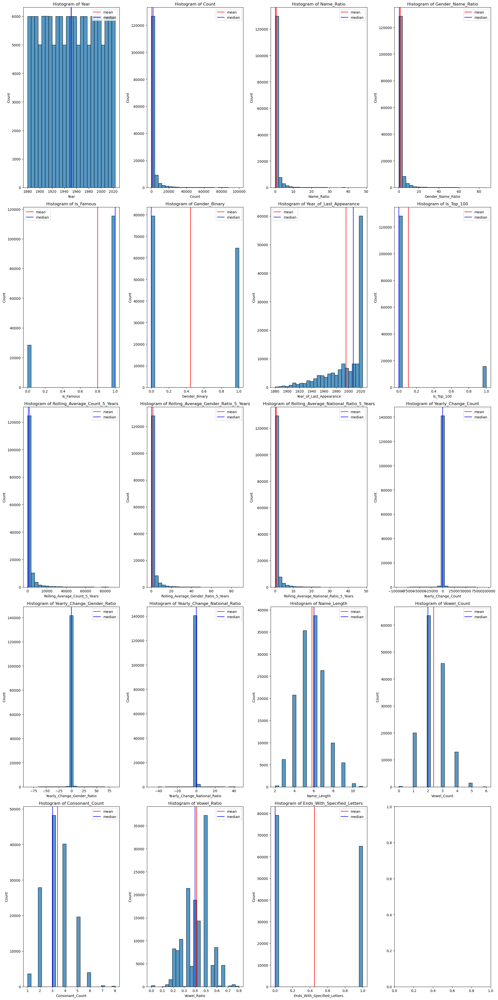

In [38]:
plt.subplots(5,4, figsize=(20,40))
for i, col in enumerate(df_num.columns):
    plt.subplot(5, 4, i+1)
    sns.histplot(df_num[col], bins=25)
    plt.axvline(df_num[col].mean(), label='mean', color='red')
    plt.axvline(df_num[col].median(), label='median', color='blue')
    plt.title(f'Histogram of {col}')
    plt.legend()
plt.tight_layout()
plt.show()


In [39]:
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
import pandas as pd

# Define column groups
binary_features = ['Is_Famous', 'Gender_Binary']
continuous_features = [
    'Year', 'Count', 'Name_Ratio', 'Gender_Name_Ratio', 'Year_of_Last_Appearance',
    'Rolling_Average_Count_5_Years', 'Rolling_Average_Gender_Ratio_5_Years',
    'Rolling_Average_National_Ratio_5_Years', 'Yearly_Change_Count',
    'Yearly_Change_Gender_Ratio', 'Yearly_Change_National_Ratio', 'Name_Length',
    'Vowel_Count', 'Consonant_Count', 'Vowel_Ratio', 'Ends_With_Specified_Letters'
]

# Create preprocessing transformers
preprocessor = ColumnTransformer(
    transformers=[
        ('binary', 'passthrough', binary_features),  # Leave binary features as they are
        ('continuous', Pipeline([
            ('scaler', StandardScaler()),  # Apply StandardScaler to continuous features
            ('transformer', PowerTransformer())  # Apply PowerTransformer if needed
        ]), continuous_features)
    ]
)

# Initialize and fit the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor)
])

# Split the data
X = df_num.drop('Is_Top_100', axis=1)
y = df_num['Is_Top_100']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit and transform the training data
pipeline.fit(X_train)
X_train_transformed = pipeline.transform(X_train)
X_test_transformed = pipeline.transform(X_test)

# Get feature names after transformation
# For continuous features
continuous_feature_names = pipeline.named_steps['preprocessor'].transformers_[1][1].named_steps['scaler'].get_feature_names_out()
# For binary features, they remain the same
binary_feature_names = binary_features

# Combine feature names
feature_names = list(binary_feature_names) + list(continuous_feature_names)

# Create DataFrames for transformed data
df_train_scaled = pd.DataFrame(X_train_transformed, columns=feature_names, index=X_train.index)
df_test_scaled = pd.DataFrame(X_test_transformed, columns=feature_names, index=X_test.index)

print(df_train_scaled.head())
print(df_test_scaled.head())


        Is_Famous  Gender_Binary      Year     Count  Name_Ratio  \
130356        1.0            1.0  1.406781  0.957675    0.502678   
80780         1.0            1.0  0.201601 -0.478616   -0.906503   
124463        1.0            0.0  1.261995  0.600483    0.088050   
124980        0.0            1.0  1.261995 -0.414757   -0.809040   
105364        1.0            0.0  0.803770  0.634254    0.202530   

        Gender_Name_Ratio  Year_of_Last_Appearance  \
130356           0.451401                 0.957561   
80780           -0.920408                -1.055770   
124463           0.131399                 0.688414   
124980          -0.832411                 0.058337   
105364           0.243186                -0.260091   

        Rolling_Average_Count_5_Years  Rolling_Average_Gender_Ratio_5_Years  \
130356                       0.599925                              0.029345   
80780                       -0.305166                             -0.795292   
124463                       

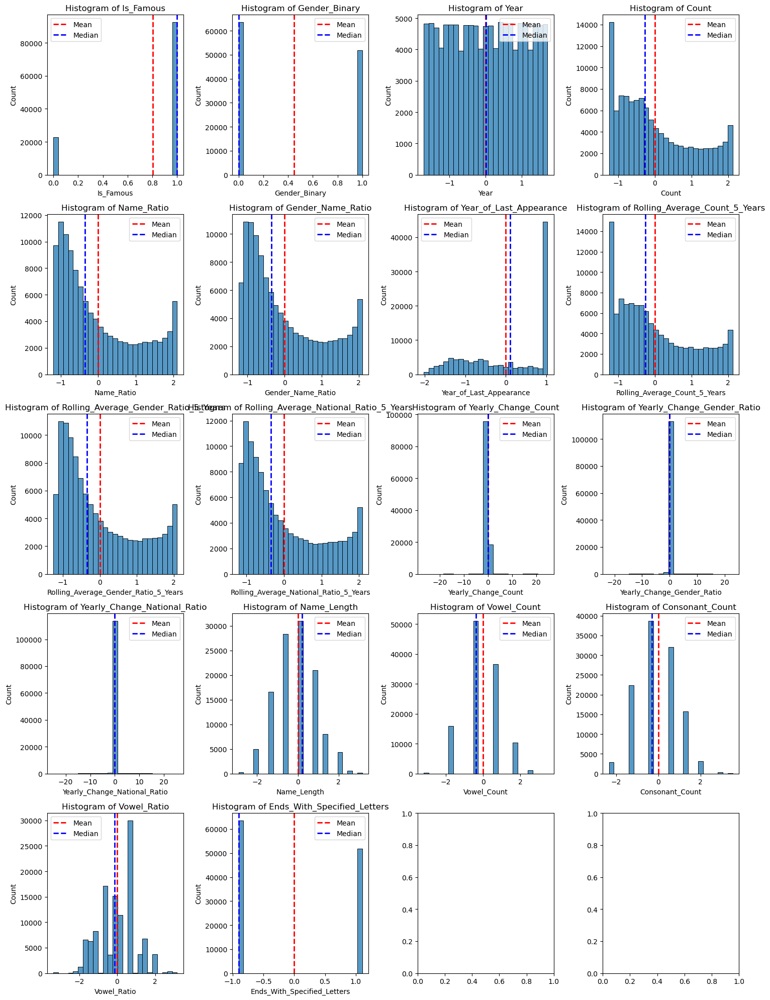

In [40]:

plt.subplots(5, 4, figsize=(15, 20))

for idx, col in enumerate(df_train_scaled.columns):
    plt.subplot(5, 4, idx + 1)
    sns.histplot(df_train_scaled[col], bins=25)
    plt.axvline(df_train_scaled[col].mean(), label="Mean", color='red', ls ='--', lw=2)
    plt.axvline(df_train_scaled[col].median(), label="Median", color='blue', ls ='--', lw=2)
    plt.title(f'Histogram of {col}')
    plt.legend()

plt.tight_layout()
plt.show()

## Part 4 - Modelling

### Part 4.1 - Logistic Regression Model 

In [41]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler

In [42]:
# Split data into train and test sets
from sklearn.model_selection import train_test_split

X = df_num.drop(columns=['Is_Top_100'])   
y = df_num['Is_Top_100']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [43]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression

# Initialize Logistic Regression
log_reg = LogisticRegression(max_iter=1000)

# Fit the model
log_reg.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = log_reg.predict(X_train)
y_test_pred = log_reg.predict(X_test)

# Evaluate accuracy
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Classification Report
class_report = classification_report(y_test, y_test_pred)

print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

print("Confusion Matrix:")
print(conf_matrix)

print("Classification Report:")
print(class_report)


Training Accuracy: 0.9875
Test Accuracy: 0.9867
Confusion Matrix:
[[25555   131]
 [  252  2871]]
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     25686
           1       0.96      0.92      0.94      3123

    accuracy                           0.99     28809
   macro avg       0.97      0.96      0.97     28809
weighted avg       0.99      0.99      0.99     28809



### Part 4.2 - Clustering 

We can start clustering the data using three different methods and evaluate their overall performance. We will be using 

- K-Means 
- Gaussian Mixture Model
- Hierarchical Clustering (Agglomerative)

In [45]:
# First we need to create a subset of the data
df_samp = data2.sample(frac=0.25, random_state=45)

In [130]:
df_samp.shape

(36010, 22)

In [47]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering

from sklearn.metrics import silhouette_score

In [48]:
# we will test different values for the number of clusters
ks= np.arange(2,10)# we test cluster sizes from 2 to9

In [112]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PowerTransformer, StandardScaler

In [133]:
# Define column groups
binary_features = ['Is_Famous', 'Gender_Binary']
continuous_features = [
    'Year', 'Count', 'Name_Ratio', 'Gender_Name_Ratio', 'Year_of_Last_Appearance',
    'Rolling_Average_Count_5_Years', 'Rolling_Average_Gender_Ratio_5_Years',
    'Rolling_Average_National_Ratio_5_Years', 'Yearly_Change_Count',
    'Yearly_Change_Gender_Ratio', 'Yearly_Change_National_Ratio', 'Name_Length',
    'Vowel_Count', 'Consonant_Count', 'Vowel_Ratio', 'Ends_With_Specified_Letters'
]

# Split the data first
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the preprocessor pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('binary', 'passthrough', binary_features),
        ('continuous', Pipeline([
            ('scaler', StandardScaler()), 
            ('transformer', PowerTransformer()) 
        ]), continuous_features)
    ]
)

# Fit the scaler only on the training data
pipeline = Pipeline([('preprocessor', preprocessor)])
pipeline.fit(X_train)

# Transform both training and test sets
X_train_transformed = pipeline.transform(X_train)
X_test_transformed = pipeline.transform(X_test)

# Create DataFrames for transformed data
df_train_scaled = pd.DataFrame(X_train_transformed, columns=feature_names, index=X_train.index)
df_test_scaled = pd.DataFrame(X_test_transformed, columns=feature_names, index=X_test.index)


In [134]:
df_train_scaled.shape

(28808, 18)

In [136]:
df_train_scaled.isna().sum()

Is_Famous                                 0
Gender_Binary                             0
Year                                      0
Count                                     0
Name_Ratio                                0
Gender_Name_Ratio                         0
Year_of_Last_Appearance                   0
Rolling_Average_Count_5_Years             0
Rolling_Average_Gender_Ratio_5_Years      0
Rolling_Average_National_Ratio_5_Years    0
Yearly_Change_Count                       0
Yearly_Change_Gender_Ratio                0
Yearly_Change_National_Ratio              0
Name_Length                               0
Vowel_Count                               0
Consonant_Count                           0
Vowel_Ratio                               0
Ends_With_Specified_Letters               0
dtype: int64

In [ ]:
 # Clustering Models

# 1. K-Means Clustering
def apply_kmeans(X, ks):
    sil_scores = []
    for k in ks:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X)
        sil_score = silhouette_score(X, labels)
        sil_scores.append(sil_score)
        print(f'K-Means with k={k} has a silhouette score of {sil_score:.4f}')
    return sil_scores

ks = range(2, 9)
sil_scores_kmeans = apply_kmeans(X_train_transformed, ks)


K-Means with k=2 has a silhouette score of 0.2992
K-Means with k=3 has a silhouette score of 0.2089


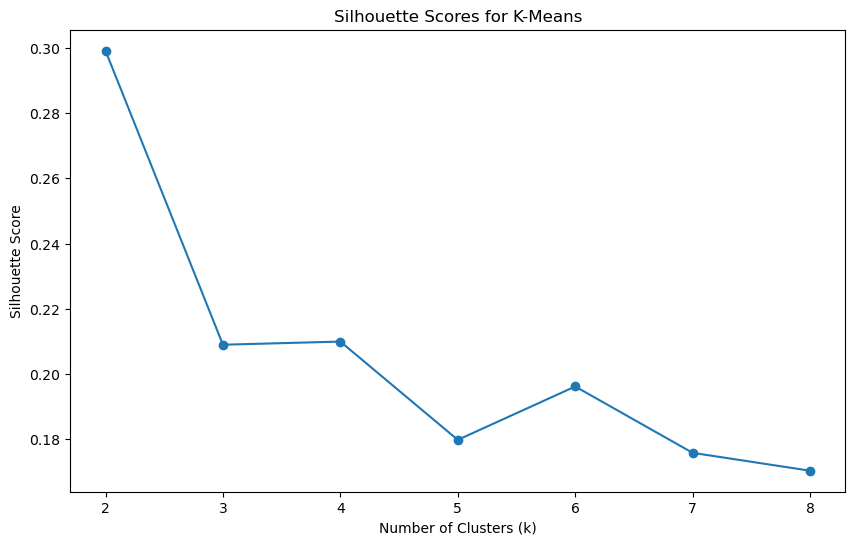

In [56]:
# Plot silhouette scores for K-Means
plt.figure(figsize=(10, 6))
plt.plot(ks, sil_scores_kmeans, marker='o')
plt.title('Silhouette Scores for K-Means')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

In [69]:

# 2. Agglomerative Clustering
def apply_agglomerative(X, ks):
    sil_scores = []
    for k in ks:
        agglom = AgglomerativeClustering(n_clusters=k, linkage='ward')
        labels = agglom.fit_predict(X)
        sil_score = silhouette_score(X, labels)
        sil_scores.append(sil_score)
        print(f'Agglomerative Clustering with k={k} has a silhouette score of {sil_score:.4f}')
    return sil_scores

sil_scores_agglomerative = apply_agglomerative(X_train_transformed, ks)





Agglomerative Clustering with k=2 has a silhouette score of 0.2861
Agglomerative Clustering with k=3 has a silhouette score of 0.2860
Agglomerative Clustering with k=4 has a silhouette score of 0.2852
Agglomerative Clustering with k=5 has a silhouette score of 0.1887
Agglomerative Clustering with k=6 has a silhouette score of 0.1598
Agglomerative Clustering with k=7 has a silhouette score of 0.1315
Agglomerative Clustering with k=8 has a silhouette score of 0.1259


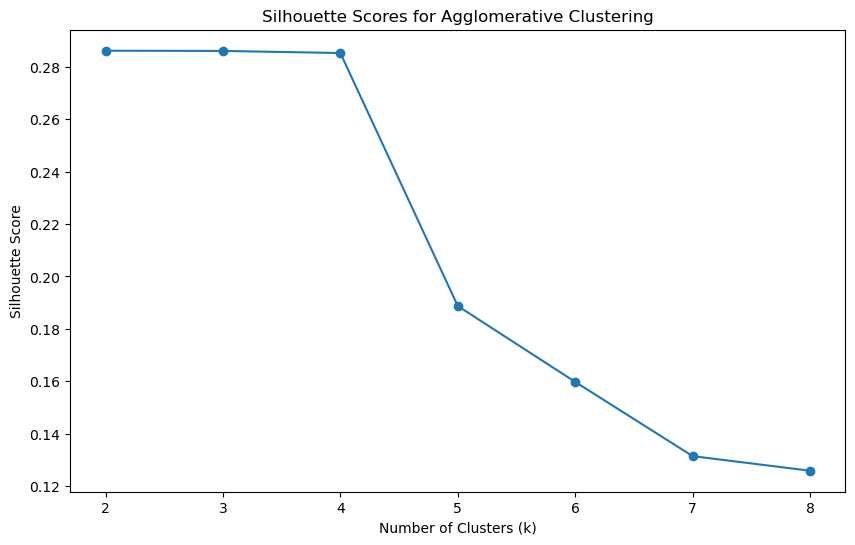

In [58]:
# Plot silhouette scores for Agglomerative Clustering
plt.figure(figsize=(10, 6))
plt.plot(ks, sil_scores_agglomerative, marker='o')
plt.title('Silhouette Scores for Agglomerative Clustering')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

In [68]:
# 3. DBSCAN Clustering

from sklearn.cluster import DBSCAN

def apply_dbscan(X, eps_values):
    sil_scores = []
    for eps in eps_values:
        dbscan = DBSCAN(eps=eps, min_samples=5)
        labels = dbscan.fit_predict(X)
        # DBSCAN does not always produce clusters, so skip if no clusters are found
        if len(set(labels)) > 1:
            sil_score = silhouette_score(X, labels)
            sil_scores.append(sil_score)
            print(f'DBSCAN with eps={eps} has a silhouette score of {sil_score:.4f}')
        else:
            sil_scores.append(None)
            print(f'DBSCAN with eps={eps} produced no clusters')
    return sil_scores

eps_values = [0.3, 0.5, 0.7]
sil_scores_dbscan = apply_dbscan(X_train_transformed, eps_values)



DBSCAN with eps=0.3 has a silhouette score of -0.3136
DBSCAN with eps=0.5 has a silhouette score of -0.2147
DBSCAN with eps=0.7 has a silhouette score of -0.2662


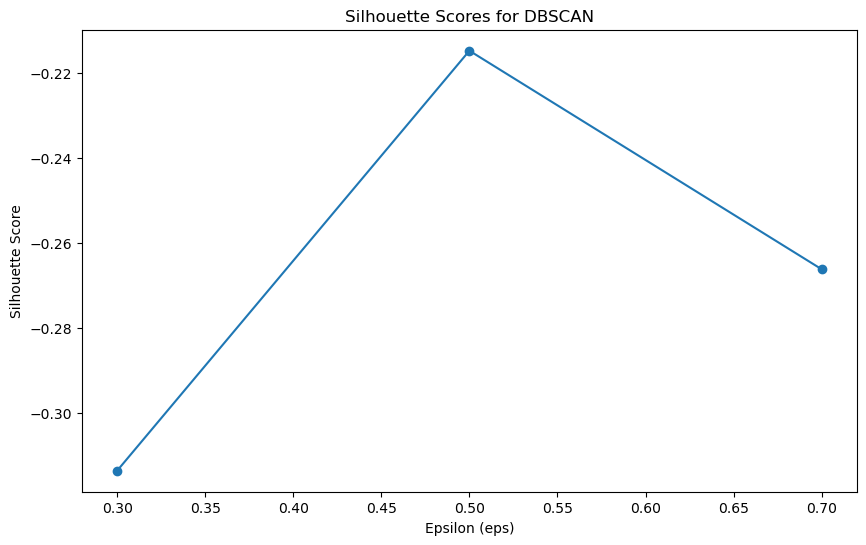

In [61]:
 # Plot silhouette scores for DBSCAN
plt.figure(figsize=(10, 6))
plt.plot(eps_values, [score for score in sil_scores_dbscan if score is not None], marker='o')
plt.title('Silhouette Scores for DBSCAN')
plt.xlabel('Epsilon (eps)')
plt.ylabel('Silhouette Score')
plt.show()

In [71]:
def apply_gaussian(X, ks):
    sil_scores = []
    for k in ks:
        gmm = GaussianMixture(n_components=k)
        labels = gmm.fit_predict(X)  # Get the labels from the model
        sil_score = silhouette_score(X, labels)  # Calculate the silhouette score
        sil_scores.append(sil_score)
        print(f'Gaussian Clustering with k={k} has a silhouette score of {sil_score:.4f}')
    return sil_scores

# Assuming X_train_transformed and ks are defined
sil_scores_gaussian = apply_gaussian(X_train_transformed, ks)

Gaussian Clustering with k=2 has a silhouette score of 0.1552
Gaussian Clustering with k=3 has a silhouette score of 0.1335
Gaussian Clustering with k=4 has a silhouette score of 0.0066
Gaussian Clustering with k=5 has a silhouette score of 0.0431
Gaussian Clustering with k=6 has a silhouette score of 0.0754
Gaussian Clustering with k=7 has a silhouette score of 0.0665
Gaussian Clustering with k=8 has a silhouette score of 0.0092


In [ ]:
# Try other way

In [64]:
silScoresK=[]
silScoresA=[]
silScoresG=[]

for k in ks:
    print(f'We are currently on k={k}')
    # kmeans
    kmeans=KMeans(n_clusters=k)
    kmeans.fit(df_train_scaled)
    silScoresK.append(silhouette_score(df_train_scaled, kmeans.labels_))
    
  
    # agglomerative clustering
    agglom=AgglomerativeClustering(n_clusters=k, linkage='ward')
    agglom.fit(df_train_scaled)
    silScoresA.append(silhouette_score(df_train_scaled, agglom.labels_))
    

    # gaussian
    gmm=GaussianMixture(n_components=k)
    gmm.fit(df_train_scaled)
    silScoresG.append(silhouette_score(df_train_scaled, gmm.predict(df_train_scaled)))

We are currently on k=2
We are currently on k=3
We are currently on k=4
We are currently on k=5
We are currently on k=6
We are currently on k=7
We are currently on k=8


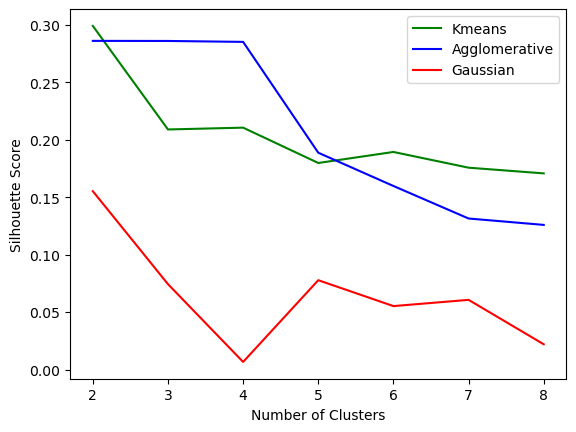

In [65]:
plt.figure()
plt.plot(ks,silScoresK, label="Kmeans", color='green')
plt.plot(ks,silScoresA, label="Agglomerative", color='blue')
plt.plot(ks,silScoresG, label="Gaussian", color='red')
plt.legend()
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [118]:
# Initialize KMeans
kmeans = KMeans(n_clusters=2, random_state=42)

# Fit KMeans to the scaled training data
kmeans.fit(df_train_scaled)

# Predict cluster labels
kmeans_labels = kmeans.predict(df_train_scaled)

# Add cluster labels to the DataFrame
df_train_scaled['kmeans_label'] = kmeans_labels

# Print the DataFrame with cluster labels
print(df_train_scaled.head(1))


       Is_Famous  Gender_Binary      Year     Count  Name_Ratio  \
92002        1.0            0.0  0.475366 -0.748802   -1.030369   

       Gender_Name_Ratio  Year_of_Last_Appearance  \
92002          -1.018674                 1.031283   

       Rolling_Average_Count_5_Years  Rolling_Average_Gender_Ratio_5_Years  \
92002                       -0.82898                             -1.127332   

       Rolling_Average_National_Ratio_5_Years  Yearly_Change_Count  \
92002                               -1.135835            -0.009203   

       Yearly_Change_Gender_Ratio  Yearly_Change_National_Ratio  Name_Length  \
92002                   -0.000305                      0.000151     0.192482   

       Vowel_Count  Consonant_Count  Vowel_Ratio  Ends_With_Specified_Letters  \
92002     0.734069        -0.319545     0.700503                    -0.909773   

       kmeans_label  
92002             0  


In [116]:
from sklearn.decomposition import PCA

myPCA = PCA(n_components=3)
my_pca_results = myPCA.fit_transform(df_train_scaled)


In [117]:
type(my_pca_results)

numpy.ndarray

In [76]:
pca_df = pd.DataFrame(my_pca_results, index = df_train_scaled.index, columns=[f'PC{i+1}'for i in range(3)])

In [109]:
pca_df.isna().sum()

PC1             0
PC2             0
PC3             0
kmeans_label    0
dtype: int64

In [77]:
pca_df.head()

,PC1,PC2,PC3
92002,-2.095183,0.108548,-0.091208
58412,-0.266484,-0.088678,1.296014
33317,-0.220689,0.237609,-0.650212
62961,-2.638151,0.130763,1.390506
10876,-3.204780,0.293077,0.719934


In [78]:
np,sum(myPCA.explained_variance_ratio_)

(<module 'numpy' from '/Users/yingzhou/anaconda3/envs/ml_env/lib/python3.8/site-packages/numpy/__init__.py'>,
 0.6658164473825054)

In [119]:
# let's look at the loadings
loadings=myPCA.components_

loadingsDF=pd.DataFrame(loadings, columns=list(df_train_scaled.columns.drop(['kmeans_label'])))
loadingsDF.head()

,Is_Famous,Gender_Binary,Year,Count,Name_Ratio,Gender_Name_Ratio,Year_of_Last_Appearance,Rolling_Average_Count_5_Years,Rolling_Average_Gender_Ratio_5_Years,Rolling_Average_National_Ratio_5_Years,Yearly_Change_Count,Yearly_Change_Gender_Ratio,Yearly_Change_National_Ratio,Name_Length,Vowel_Count,Consonant_Count,Vowel_Ratio,Ends_With_Specified_Letters
0,0.048691,0.015931,0.131017,0.389676,0.396289,0.396909,0.191621,0.384046,0.393473,0.392802,0.052421,0.054247,0.053853,0.006751,-0.040576,0.040209,-0.056224,-0.073458
1,-0.011281,-0.003437,-0.052692,0.004245,0.021974,0.020749,-0.053238,-0.076392,-0.065811,-0.064428,0.534144,0.582053,0.586141,-0.009847,0.041360,-0.044812,0.062167,0.060533
2,0.010734,0.143367,0.064362,-0.016869,-0.076240,-0.063462,0.017510,-0.018195,-0.067731,-0.080633,0.055931,0.059583,0.060053,0.039447,-0.437794,0.389516,-0.599364,-0.488746


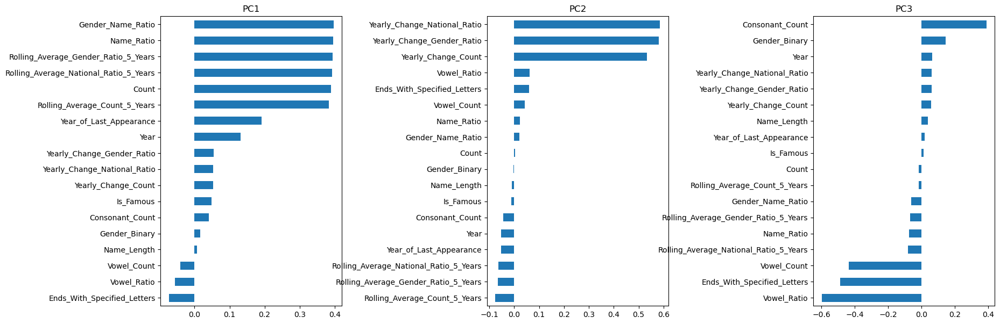

In [120]:
plt.subplots(1,3, figsize=(20,7))

plt.subplot(1,3,1)
loadingsDF.iloc[0,:].sort_values(ascending=True).plot(kind='barh')
plt.title('PC1')

plt.subplot(1,3,2)
loadingsDF.iloc[1,:].sort_values(ascending=True).plot(kind='barh')
plt.title('PC2')

plt.subplot(1,3,3)
loadingsDF.iloc[2,:].sort_values(ascending=True).plot(kind='barh')
plt.title('PC3')

plt.subplots_adjust(wspace=0.8)
plt.show()

In [121]:
pca_df['kmeans_label']= kmeans_labels

In [123]:
# let's visualize these clusters!
fig=px.scatter_3d(pca_df, x='PC1', y='PC2',z='PC3',color='kmeans_label', opacity=0.5)
fig.show()

In [94]:

# Drop columns that should not be included in the mean calculation
features_df = df_train_scaled.drop(columns=['kmeans_label'])

# Group by KMeans labels and compute the mean for each feature
featureMeans = features_df.groupby(df_train_scaled['kmeans_label']).mean().T

# Display the resulting DataFrame
print(featureMeans)


kmeans_label                                   0         1
Is_Famous                               0.737199  0.939519
Gender_Binary                           0.436744  0.472662
Year                                   -0.108888  0.222212
Count                                  -0.560444  1.143723
Name_Ratio                             -0.606134  1.236964
Gender_Name_Ratio                      -0.605345  1.235353
Year_of_Last_Appearance                -0.212615  0.433892
Rolling_Average_Count_5_Years          -0.547303  1.116904
Rolling_Average_Gender_Ratio_5_Years   -0.596195  1.216681
Rolling_Average_National_Ratio_5_Years -0.597059  1.218443
Yearly_Change_Count                    -0.058431  0.119242
Yearly_Change_Gender_Ratio             -0.063977  0.130560
Yearly_Change_National_Ratio           -0.062924  0.128412
Name_Length                            -0.001463  0.002985
Vowel_Count                             0.040418 -0.082483
Consonant_Count                        -0.033379  0.0681

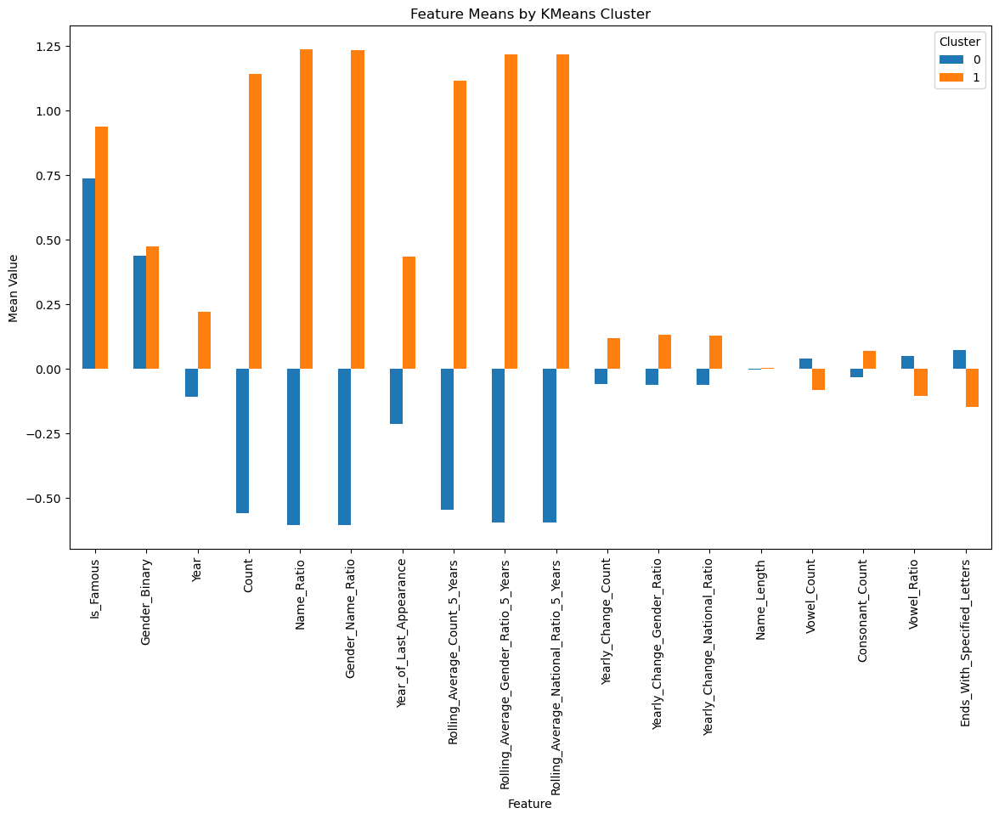

In [124]:
# Plotting the feature means for each cluster
featureMeans.plot(kind='bar', figsize=(14, 8))
plt.title('Feature Means by KMeans Cluster')
plt.ylabel('Mean Value')
plt.xlabel('Feature')
plt.xticks(rotation=90)
plt.legend(title='Cluster')
plt.show()

In [131]:
# Assign kmeans labels and PCA components back to df_samp, only for training data
df_samp.loc[X_train.index, 'kmeans'] = pca_df['kmeans_label']


In [132]:
df_samp.isna().sum()

Name                                         0
Year                                         0
Gender                                       0
Count                                        0
Name_Ratio                                   0
Gender_Name_Ratio                            0
Is_Famous                                    0
Gender_Binary                                0
Year_of_Last_Appearance                      0
Is_Top_100                                   0
Rolling_Average_Count_5_Years                0
Rolling_Average_Gender_Ratio_5_Years         0
Rolling_Average_National_Ratio_5_Years       0
Yearly_Change_Count                          0
Yearly_Change_Gender_Ratio                   0
Yearly_Change_National_Ratio                 0
Name_Length                                  0
Vowel_Count                                  0
Consonant_Count                              0
Vowel_Ratio                                  0
Ends_With_Specified_Letters                  0
kmeans       

In [111]:
print(df_train_scaled.isna().sum())


Is_Famous                                 0
Gender_Binary                             0
Year                                      0
Count                                     0
Name_Ratio                                0
Gender_Name_Ratio                         0
Year_of_Last_Appearance                   0
Rolling_Average_Count_5_Years             0
Rolling_Average_Gender_Ratio_5_Years      0
Rolling_Average_National_Ratio_5_Years    0
Yearly_Change_Count                       0
Yearly_Change_Gender_Ratio                0
Yearly_Change_National_Ratio              0
Name_Length                               0
Vowel_Count                               0
Consonant_Count                           0
Vowel_Ratio                               0
Ends_With_Specified_Letters               0
kmeans_label                              0
dtype: int64


In [102]:
df_samp.head()

,Name,Year,Gender,Count,Name_Ratio,Gender_Name_Ratio,Is_Famous,Gender_Binary,Year_of_Last_Appearance,Is_Top_100,Rolling_Average_Count_5_Years,Rolling_Average_Gender_Ratio_5_Years,Rolling_Average_National_Ratio_5_Years,Yearly_Change_Count,Yearly_Change_Gender_Ratio,Yearly_Change_National_Ratio,Name_Length,Vowel_Count,Consonant_Count,Vowel_Ratio,Ends_With_Specified_Letters,kmeans
83369,Wesley,1963,M,2098,0.530021,1.033019,1,1,2023,0,2016.4,0.961835,0.493414,136.0,0.084426,0.043754,6,2,4,0.333333,0,1.0
140237,Amir,2020,M,3175,0.951213,1.842022,1,1,2023,0,2761.6,1.527329,0.789261,208.0,0.186536,0.095871,4,2,2,0.500000,0,1.0
98226,Theresa,1978,F,2922,0.920657,1.907490,1,0,2002,0,3295.4,2.215792,1.069689,8.0,0.006812,0.003270,7,3,4,0.428571,1,1.0
14322,Milton,1894,M,156,0.460598,1.347523,1,1,1985,0,154.0,1.368523,0.484580,-18.0,-0.201650,-0.074419,6,2,4,0.333333,0,0.0
135972,Willa,2015,F,674,0.182170,0.377779,1,0,2023,0,347.4,0.195895,0.095320,398.0,0.228938,0.109500,5,2,3,0.400000,1,NaN


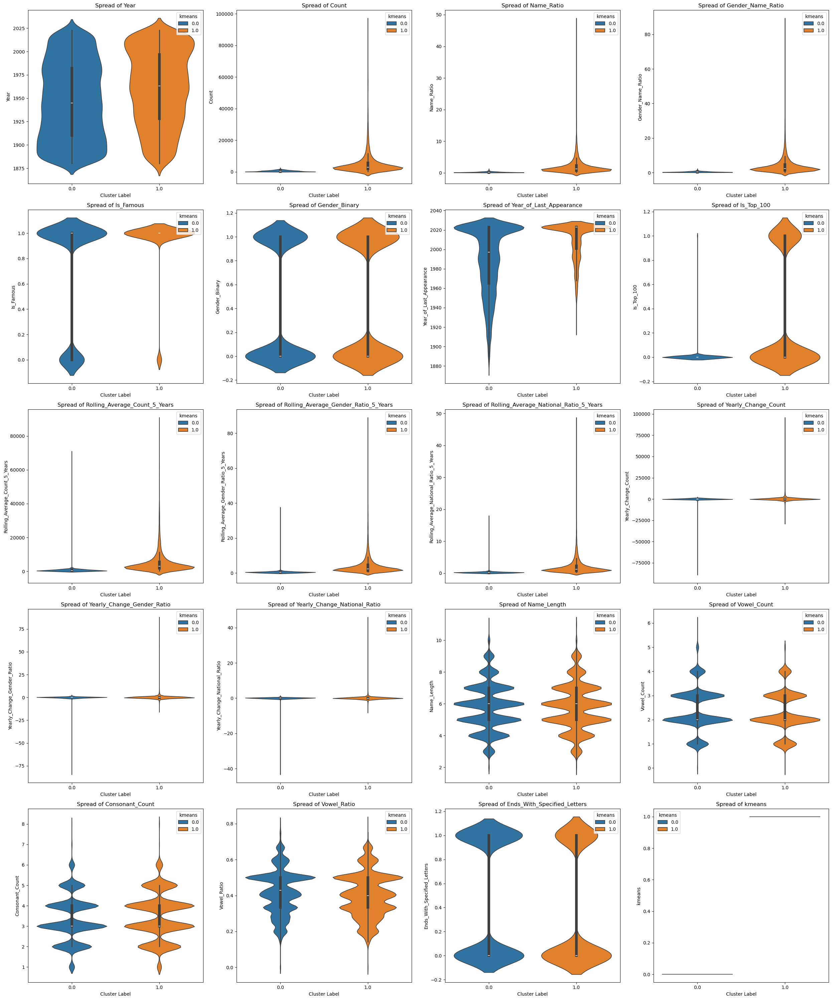

In [110]:
plt.subplots(5,4, figsize=(25,30))
for i, col in enumerate(df_samp.drop(columns=['Name','Gender']).columns):
  plt.subplot(5,4,i+1)
  sns.violinplot(y=col, x='kmeans', data=df_samp, hue='kmeans')
  plt.xlabel('Cluster Label')
  plt.ylabel(col)
  plt.title(f'Spread of {col}')
plt.tight_layout()
plt.show()